## Import Modules

In [1]:
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
#import tensorflow_probability as tfp

from tensorflow.keras import layers, models

from IPython.display import clear_output
from tensorflow.keras.applications.vgg19 import VGG19
print(tf.__version__)

2.8.0


## Configs

In [2]:
########### YOUR CODE HERE ################
"""Tùy thuộc vào cách load data để cần 1 hay
nhiều path tới data ở đây mình dùng 2 nếu các 
bạn dùng ít hoặc nhiệu hơn thì có thể xóa hoặc 
khai báo thêm"""

# Path tới data folder 
PATH = '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3'
DISP_PATH = '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/disp_noc/disp_noc_0'
###########################################

BUFFER_SIZE = 20
BATCH_SIZE  = 1
IMG_WIDTH   = 1024
IMG_HEIGHT  = 256

LOW_WIDTH   = 256
LOW_HEIGHT  = 64

## Prepare Data

In [3]:
def sigmoid_scaler(in_tensor, is_four_dims=False):
#     in_tensor = in_tensor/4.0 + 0.5
    in_tensor = tf.math.abs(in_tensor)
    if is_four_dims:
        max_mat = tf.math.reduce_max( in_tensor, axis=[1,2,3], keepdims=True)
    else:
        max_mat = tf.math.reduce_max( in_tensor, axis=[0,1,2], keepdims=True)
    out_tensor = in_tensor/max_mat
    
    return out_tensor

In [4]:
def crop_img(image, target_h, target_w):
    img_h = tf.shape(image)[0]
    img_w = tf.shape(image)[1]
    offset_h = img_h - target_h
    offset_w = 0
    
    return tf.image.crop_to_bounding_box(image, offset_height=offset_h, offset_width=offset_w, 
                                         target_height=target_h, target_width=target_w)

In [5]:
def load(image_path, disp_path):
    
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image)
    half_w = tf.shape(image)[1]//2
    left_image = image[:, 0:half_w, :]
    right_image = image[:, half_w:, :]
    
    left_image = crop_img(left_image, target_h=IMG_HEIGHT, target_w=IMG_WIDTH)
    right_image = crop_img(right_image, target_h=IMG_HEIGHT, target_w=IMG_WIDTH)
    
    left_image_lr = tf.image.resize(left_image, size=(LOW_HEIGHT, LOW_WIDTH))
    left_target_lr = tf.image.resize(left_image, size=(LOW_HEIGHT, LOW_WIDTH))
    
    right_image_lr = tf.image.resize(right_image, size=(LOW_HEIGHT, LOW_WIDTH))
    right_target_lr = tf.image.resize(right_image, size=(LOW_HEIGHT, LOW_WIDTH))
    
    left_target_hr = crop_img(left_image, target_h=IMG_HEIGHT, target_w=IMG_WIDTH)
    right_target_hr = crop_img(right_image, target_h=IMG_HEIGHT, target_w=IMG_WIDTH)
    
    # cast
    left_image_lr = tf.cast(left_image_lr, dtype=tf.float32)
    left_target_lr = tf.cast(left_target_lr, dtype=tf.float32)
    
    right_image_lr = tf.cast(right_image_lr, dtype=tf.float32)
    right_target_lr = tf.cast(right_target_lr, dtype=tf.float32)
    
    left_target_hr = tf.cast(left_target_hr, dtype=tf.float32)
    right_target_hr = tf.cast(right_target_hr, dtype=tf.float32)
    
    # Noise
    noise_per = 0.20
    left_noise = tf.random.uniform(shape=(LOW_HEIGHT,LOW_WIDTH,3), minval=1-noise_per, maxval=1+noise_per)
    right_noise = tf.random.uniform(shape=(LOW_HEIGHT,LOW_WIDTH,3), minval=1-noise_per, maxval=1+noise_per)
    
    left_image_lr = left_image_lr*left_noise
    left_image_lr = tf.clip_by_value(left_image_lr, 0, 255)
    
    right_image_lr = right_image_lr*right_noise
    right_image_lr = tf.clip_by_value(right_image_lr, 0, 255)
    
    # Disparity map
    disp_map   = tf.io.read_file(disp_path)
    disp_map   = tf.image.decode_png(disp_map, dtype=tf.uint16, channels=1)
    disp_map = crop_img(disp_map, target_h=IMG_HEIGHT, target_w=IMG_WIDTH)
    disp_map = tf.cast(disp_map, tf.float32)/256.0
    
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map


(64, 256, 3)
(64, 256, 3)
(64, 256, 3)
(64, 256, 3)
(256, 1024, 3)
(256, 1024, 3)
(256, 1024, 1)


2022-03-31 23:11:28.020278: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 23:11:28.024689: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 23:11:28.025361: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-31 23:11:28.026263: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

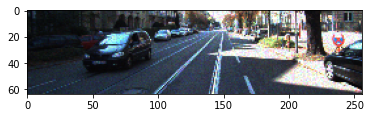

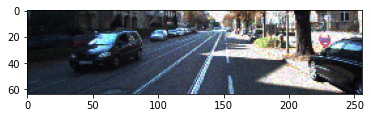

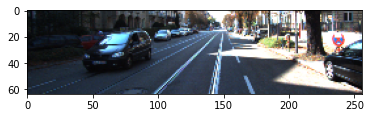

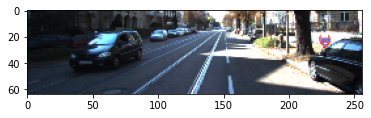

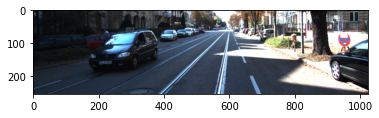

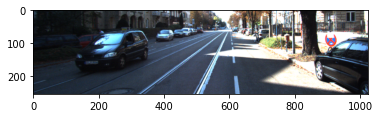

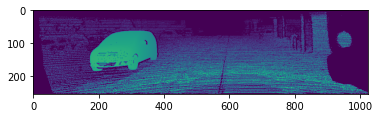

In [6]:
left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map = load(PATH+'/000000_10.png',
                                                                                                                 DISP_PATH+'/000000_10.png')
print(left_image_lr.shape)
print(right_image_lr.shape)
print(left_target_lr.shape)
print(right_target_lr.shape)
print(left_target_hr.shape)
print(right_target_hr.shape)
print(disp_map.shape)

# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(left_image_lr/255.0)
plt.figure()
plt.imshow(right_image_lr/255.0)
plt.figure()
plt.imshow(left_target_lr/255.0)
plt.figure()
plt.imshow(right_target_lr/255.0)
plt.figure()
plt.imshow(left_target_hr/255.0)
plt.figure()
plt.imshow(right_target_hr/255.0)
plt.figure()
plt.imshow(disp_map/255.0)

In [7]:
def get_coors(disp_map):
    disp_map = tf.cast(disp_map,dtype=tf.int32)
    y_x_coors =  tf.where(tf.squeeze(disp_map)>0)
    y_x_coors = tf.cast(y_x_coors, dtype=tf.int32)
    
    l_y = tf.slice(y_x_coors, begin=[0, 0], size=[-1,1])
    l_x = tf.slice(y_x_coors, begin=[0, 1], size=[-1,1])

    l_y_x_coors =  tf.concat([l_y, l_x], axis=-1)
    r_x = l_x - tf.gather_nd(disp_map, l_y_x_coors)

    r_y_x_coors = tf.concat([l_y, r_x], axis=-1)
    return l_y_x_coors,  r_y_x_coors


def normalize(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    normalizing the images to [-1, 1]    
    Parameters
    ----------
    image_lr     : tf.Tensor (tf.float32) 
        ảnh input low resolution và nhiễu
    target_lr     : tf.Tensor (tf.float32) 
        ảnh target low resolution  
    target_hr    : tf.Tensor (tf.float32) 
        ảnh target high resolution 
    
    Returns
    -------
    image_lr     : tf.Tensor (tf.float32) 
        ảnh input low resolution và nhiễu
    target_lr     : tf.Tensor (tf.float32) 
        ảnh target low resolution  
    target_hr    : tf.Tensor (tf.float32) 
        ảnh target high resolution 
    """
    left_image_lr  = (left_image_lr/127.5) - 1  
    right_image_lr = (right_image_lr/127.5) - 1 
    left_target_lr = (left_target_lr/127.5) - 1 
    right_target_lr  = (right_target_lr/127.5) - 1  
    left_target_hr = (left_target_hr/127.5) - 1 
    right_target_hr = (right_target_hr/127.5) - 1 
    
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr
    ###########################################

#@tf.function()
def random_jitter(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map):
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        left_image_lr  = tf.image.flip_left_right(left_image_lr)
        right_image_lr  = tf.image.flip_left_right(right_image_lr)
        left_target_lr  = tf.image.flip_left_right(left_target_lr)
        right_target_lr  = tf.image.flip_left_right(right_target_lr)
        left_target_hr  = tf.image.flip_left_right(left_target_hr)
        right_target_hr  = tf.image.flip_left_right(right_target_hr)
        disp_map = tf.image.flip_left_right(disp_map)
        
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map
    

def load_image_train(image_path, disp_path):
    # load ảnh 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map = load(image_path, disp_path)

    # random jiter 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map = random_jitter(left_image_lr, 
                                                                                                                    right_image_lr, 
                                                                                                                    left_target_lr, 
                                                                                                                    right_target_lr, 
                                                                                                                    left_target_hr, 
                                                                                                                    right_target_hr,
                                                                                                                    disp_map)

    # normalize ảnh
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = normalize(left_image_lr, 
                                                                                                               right_image_lr, 
                                                                                                               left_target_lr, 
                                                                                                               right_target_lr, 
                                                                                                               left_target_hr, 
                                                                                                               right_target_hr)
    
    l_y_x_coors,  r_y_x_coors = get_coors(disp_map)
    
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map, l_y_x_coors,  r_y_x_coors 



def load_image_test(image_path, disp_path):
    # load ảnh 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map = load(image_path, disp_path)

    # normalize ảnh
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = normalize(left_image_lr, 
                                                                                                               right_image_lr, 
                                                                                                               left_target_lr, 
                                                                                                               right_target_lr, 
                                                                                                               left_target_hr, 
                                                                                                               right_target_hr)
    l_y_x_coors,  r_y_x_coors = get_coors(disp_map)
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map, l_y_x_coors, r_y_x_coors 
    


In [8]:
VAL_IMGS = ['000000_10.png', '000001_10.png', '000002_10.png', '000003_10.png', '000004_10.png',
                '000005_10.png', '000006_10.png', '000007_10.png', '000008_10.png', '000009_10.png',]

In [9]:
def get_path_imgs(img_names):
    image_path = []
    disp_path = []
    for im_n in img_names:
        image_path.append(os.path.join(PATH, im_n))
        disp_path.append(os.path.join(DISP_PATH, im_n))

    return image_path, disp_path


def get_train_val_img_names():
#     img_names = [im_n for im_n in os.listdir(os.path.join(PATH)) if im_n.find('_10') > -1]
    img_names = os.listdir(PATH)
    assert len(img_names) == 200
    train_img_names = [imn for imn in img_names if imn not in VAL_IMGS]
    val_img_names = VAL_IMGS
    
    train_imgs_path = get_path_imgs(train_img_names)
    val_imgs_path = get_path_imgs(val_img_names)
    
    return train_imgs_path, val_imgs_path

In [10]:
train_imgs_path, val_imgs_path = get_train_val_img_names()

In [11]:
val_imgs_path

(['/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000000_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000001_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000002_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000003_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000004_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000005_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000006_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000007_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000008_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob3/000009_10.png'],
 ['/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/disp_noc/disp_noc_0/000000_10.png',
  '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/disp_noc/

In [12]:
# train_dataset

train_dataset = tf.data.Dataset.from_tensor_slices((train_imgs_path[0],train_imgs_path[1]))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)

# test_dataset
test_dataset = tf.data.Dataset.from_tensor_slices((val_imgs_path[0],val_imgs_path[1]))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 256, 1024, 3)
(1, 256, 1024, 3)
(1, 256, 1024, 1)


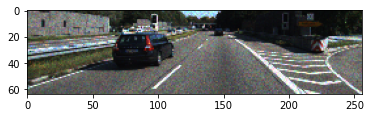

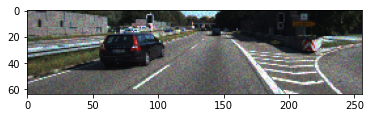

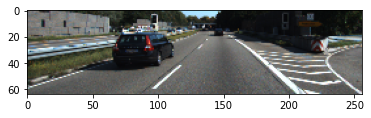

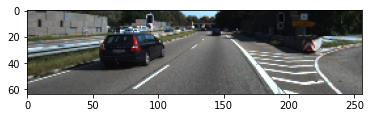

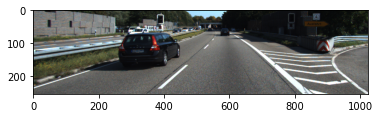

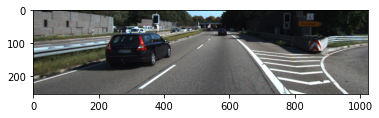

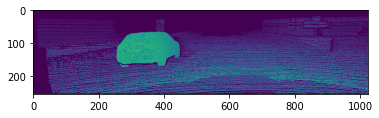

In [13]:
for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, disp_map, l_y_x_coors, r_y_x_coors in train_dataset.take(1):
    print(left_image_lr.shape)
    print(right_image_lr.shape)
    print(left_target_lr.shape)
    print(right_target_lr.shape)
    print(left_target_hr.shape)
    print(right_target_hr.shape)
    print(disp_map.shape)

    # casting to int for matplotlib to show the image
    plt.figure()
    plt.imshow(left_image_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_image_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(left_target_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_target_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(left_target_hr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_target_hr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(disp_map[0])
    break

In [14]:
def test_pairs(target_l_sr, target_r_sr, l_y_x_coors, r_y_x_coors, patch_size=65):
    idx = np.random.randint(0, l_y_x_coors.numpy().shape[1])
    print(idx)
    l_y = l_y_x_coors[0][idx][0].numpy()
    l_x = l_y_x_coors[0][idx][1].numpy()
    
    r_y = r_y_x_coors[0][idx][0].numpy()
    r_x = r_y_x_coors[0][idx][1].numpy()
    
    half_patch_size = patch_size//2
    
    l_patch = target_l_sr.numpy()[0, l_y-half_patch_size:l_y+half_patch_size, l_x-half_patch_size:l_x+half_patch_size]
    r_pathc = target_r_sr.numpy()[0, r_y-half_patch_size:r_y+half_patch_size, r_x-half_patch_size:r_x+half_patch_size]
    
    pairs = np.concatenate([l_patch, r_pathc], axis=1)
    pairs = pairs*0.5 +0.5
    plt.imshow(pairs)
    
    

4384


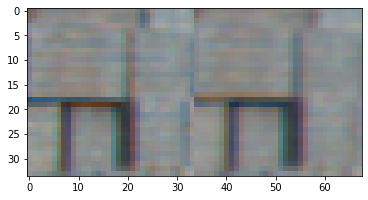

In [15]:
test_pairs(left_target_hr, right_target_hr, l_y_x_coors, r_y_x_coors, patch_size=35)

## Build Model

### Blocks

In [16]:
def extract_first_features(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Extract feature của input images CONV2D -> BN(bool) -> LeakyRelu
    padding = same, stride = 1
    Parameters
    ----------
    filters         : int
        số lượng filters
    size            : int
        size của filter
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        block CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=1
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=1, padding='same', use_bias=False))
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    
    
def downsample(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample trong Unet CONV2D -> BN(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        số lượng filters
    size            : int
        size của filter
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        block CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=2
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    


def downsample_dis(filters, size_12, size_3, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample dành cho discriminator trong Unet CONV2D -> CONV2D -> CONV2D -> BN(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        số lượng filters
    size_12         : int
        kernel size cho CONV2D 1 và 2
    size_3          : int
        kernel size cho CONV2D 3
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        CONV2D -> CONV2D -> CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer3 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=1 kernel_size=size_12
    result.add(layers.Conv2D(filters=filters, kernel_size=size_12, kernel_initializer=initializer1,
                             strides=1, padding='same', use_bias=False))
    
    # Conv2D stride=1 kernel_size=size_12
    result.add(layers.Conv2D(filters=filters, kernel_size=size_12, kernel_initializer=initializer2,
                             strides=1, padding='same', use_bias=False))
    # Conv2D stride=2 kernel_size=size_3
    result.add(layers.Conv2D(filters=filters, kernel_size=size_23, kernel_initializer=initializer3,
                             strides=2, padding='same', use_bias=False))
    
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    

def upsample(filters, size, apply_dropout=False):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    upsample trong Unet Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_dropout : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)

    # Conv2DTranspose stride=2
    result.add(layers.Conv2DTranspose(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    
    # BatchNorm
    result.add(layers.BatchNormalization())
    
    # check apply_dropout nếu True thì dùng 
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    # Relu 
    result.add(layers.ReLU())
    
    return result
    ###########################################

def downsample_sr(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample cho super resolution Conv2D -> BN(bool) -> LeakyRelu 
    padding = same, stride = 1
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_batchnorm : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2D -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    # Conv2D stride=1
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=1, padding='same', use_bias=False))
    
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    return result
    ###########################################

def upsample_sr(filters, size, apply_dropout=False):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    upsample trong super resolution Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_dropout : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)

    # Conv2DTranspose stride=2
    result.add(layers.Conv2DTranspose(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    
    # BatchNorm
    result.add(layers.BatchNormalization())
    
    # check apply_dropout nếu True thì dùng 
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################

### Generator

In [17]:
def edge_super_resolution(x):
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)    
    x = upsample_sr(filters=128, size=4, apply_dropout=False)(x)
    
    x = downsample_sr(filters=128, size=3, apply_batchnorm=True)(x)
    x = downsample_sr(filters=128, size=3, apply_batchnorm=True)(x)
    x = upsample_sr(filters=128, size=4, apply_dropout=False)(x)
    
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2D(filters=2, kernel_size=3, strides=1, padding='same', 
                                  kernel_initializer=initializer, activation='sigmoid')
    
    x = downsample_sr(filters=32, size=3, apply_batchnorm=True)(x)
    x = last(x)
    
    return x


def UNet_Edge_process(x):
    down_stack = [
        downsample(filters=64, size=4, apply_batchnorm=False),
        downsample(filters=128, size=4, apply_batchnorm=True),
        downsample(filters=256, size=4, apply_batchnorm=True),
        downsample(filters=256, size=4, apply_batchnorm=True),
        downsample(filters=256, size=4, apply_batchnorm=True),
    ]

 
    up_stack = [
        upsample(filters=256, size=4, apply_dropout=True),
        upsample(filters=256, size=4, apply_dropout=True),
        upsample(filters=128, size=4, apply_dropout=True),
        upsample(filters=64, size=4, apply_dropout=False),
    ]

    # tạo last layer nhân 2 lần kích thước feature với Conv2DTranspose(), channel=3 cho output ảnh 
    # đã xóa nhiễu (chọn activation phù hợp)
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    last = layers.Conv2D(filters=128, kernel_size=3, kernel_initializer=initializer,
                             strides=1, padding='same', activation='relu')
                
    
    # Downsampling through the model (Code tương tự như link hướng dẫn của tensorflow)
    # thực vòng lập để chạy x cho mỗi layer trong down_stack
    # đồng thời đưa kết quả mỗi layer vào list (để dùng cho skip connection)
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    # reverse skip connection list loại bỏ layer cuối (bridge không dùng skip connection)
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections (Code tương tự như link hướng dẫn của tensorflow)
    # upsamling và concatenate với level tương ứng (element trong list skip connection)
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    # đi vào layer last đã tạo ở trên để ra ảnh có kích thước bằng ảnh input và đã xóa nhiễu
    x = upsample(filters=32, size=4, apply_dropout=False)(x)
    x = last(x)
    edge_feature = x
    
    edge_hr = edge_super_resolution(x)
    
    return edge_feature, edge_hr
    


In [18]:
def UNet_process(x):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Thực hiện theo kiến trúc Unet như Generator trong hình yêu cầu 
    để loại nhiễu khỏi ảnh (Code tương tự như link hướng dẫn của tensorflow)
    Parameters
    ----------
    x         : tensor 
        feature ảnh input
    Returns
    -------
    x: tensor
        ảnh xóa nhiễu
    """
    # (Code tương tự như link hướng dẫn của tensorflow)
    
    # tạo down_stack (encoder) gồm các downsample
    # mỗi step sẽ giảm size đi 2 lần 
    # số lượng filters mỗi step [64,256,512,512,512] qua 5 lần size sẽ giảm là 32 lần
    # kernel_size=4
    down_stack = [
        downsample(filters=64, size=4, apply_batchnorm=False),
        downsample(filters=256, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
    ]

    # tạo up_stack (decoder) gồm các upsample
    # mỗi step sẽ giảm size tăng lên 2 lần và số lượng filters tăng 2
    # số lượng filters mỗi step  [512,512,256,64] qua 5 lần size sẽ giảm là 32 lần
    # kernel_size=4
    up_stack = [
        upsample(filters=512, size=4, apply_dropout=True),
        upsample(filters=512, size=4, apply_dropout=True),
        upsample(filters=256, size=4, apply_dropout=True),
        upsample(filters=64, size=4, apply_dropout=False),
    ]

    # tạo last layer nhân 2 lần kích thước feature với Conv2DTranspose(), channel=3 cho output ảnh 
    # đã xóa nhiễu (chọn activation phù hợp)
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    last = layers.Conv2DTranspose(filters=6, kernel_size=4, kernel_initializer=initializer,
                             strides=2, padding='same', activation='tanh')
                
    
    # Downsampling through the model (Code tương tự như link hướng dẫn của tensorflow)
    # thực vòng lập để chạy x cho mỗi layer trong down_stack
    # đồng thời đưa kết quả mỗi layer vào list (để dùng cho skip connection)
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    # reverse skip connection list loại bỏ layer cuối (bridge không dùng skip connection)
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections (Code tương tự như link hướng dẫn của tensorflow)
    # upsamling và concatenate với level tương ứng (element trong list skip connection)
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    # đi vào layer last đã tạo ở trên để ra ảnh có kích thước bằng ảnh input và đã xóa nhiễu
    x = last(x)
    
    return x
    ###########################################
        
    
def Generator(): 
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Thực hiện toàn bộ task của model tạo ảnh xóa nhiễu sau đó tạo ảnh 
    supre resolution (x4 size)
    
    -------
    model: tf.keras.models.Model
        model tạo ảnh xóa nhiễu và ảnh super resolution 
    """

    # tạo layer input với shape = input low resolution image (có nhiễu)
    l_inp = layers.Input(shape=(LOW_HEIGHT, LOW_WIDTH, 3))
    r_inp = layers.Input(shape=(LOW_HEIGHT, LOW_WIDTH, 3))
    
    
    
    # extract_first_features, filters=16, kernel_size  = 3
    # Các bạn có thể lựa chọn thêm các thành phần khác để cải thiện model 
    l_x = extract_first_features(filters=64, size=3, apply_batchnorm=True)(l_inp)
    r_x = extract_first_features(filters=64, size=3, apply_batchnorm=True)(r_inp)
    x = layers.Concatenate()([l_x, r_x])
    
    # Edge Detection
    edge_feature, edge_hr = UNet_Edge_process(x)
    
    # Đi vào UNet_process để denoise thu được fake_lr
    x = UNet_process(x)
    fake_lr = x

    # rẻ nhánh và đi tiếp vào extract_first_features filters = 64, kernel_size = 3
    x_l = extract_first_features(filters=64, size=3, apply_batchnorm=True)(x[..., 0:3])
    x_r = extract_first_features(filters=64, size=3, apply_batchnorm=True)(x[..., 3:])
    x = layers.Concatenate()([edge_feature, x_l, x_r])
    
    # thực hiện downsample_sr filters = 256, kernel_size = 3
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    
    # thực hiện downsample_sr filters = 256, kernel_size = 3
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    
    # thực hiện upsample_sr filters = 128, kernel_size = 4
    x = upsample_sr(filters=128, size=4, apply_dropout=False)(x)
    
    # thực hiện downsample_sr filters = 128, kernel_size = 3
    x = downsample_sr(filters=128, size=3, apply_batchnorm=True)(x)
    
    # tạo layer last Conv2DTranspose filters = 6, kernel_size = 4, strides=2  (tạo ảnh high resolution) 
    # qua layer last để lấy fake_hr (chọn activation phù hợp)
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    last = layers.Conv2DTranspose(filters=6, kernel_size=4, kernel_initializer=initializer,
                             strides=2, padding='same', activation='tanh')
    
    fake_hr = last(x)
    
    # tạo model là inputs=input layer ở trên và outputs=[fake_lr, fake_hr]
    model = models.Model(inputs=[l_inp, r_inp], outputs=[fake_lr, fake_hr, edge_hr])
    
    return model
    ###########################################

In [19]:
generator = Generator()
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 input_2 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 sequential (Sequential)        (None, 64, 256, 64)  1984        ['input_1[0][0]']                
                                                                                              

                                                                                                  
 sequential_12 (Sequential)     (None, 64, 256, 256  295936      ['conv2d_7[0][0]']               
                                )                                                                 
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 64, 256, 3)  0           ['conv2d_transpose_11[0][0]']    
 ingOpLambda)                                                                                     
                                                                                                  
 tf.__operators__.getitem_1 (Sl  (None, 64, 256, 3)  0           ['conv2d_transpose_11[0][0]']    
 icingOpLambda)                                                                                   
                                                                                                  
 sequentia

### Discriminator

In [20]:
def Discriminator3():
    inp = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 1])
    x = downsample(filters=64,  size=4, apply_batchnorm=False)(inp)
    x = downsample(filters=128, size=4, apply_batchnorm=True)(x)
    x = downsample(filters=256, size=4, apply_batchnorm=True)(x)
    
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    x = layers.Conv2D(filters=256, kernel_size=3, kernel_initializer=initializer1,
                             strides=1, use_bias=False)(x)
    x = layers.Conv2D(filters=1, kernel_size=3, kernel_initializer=initializer2,
                             strides=1, use_bias=False)(x)
    
    model = models.Model(inputs=inp, outputs=x)
    return model


In [21]:
def Discriminator1():
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Discrminator 1 dùng cho phân biệt ảnh low resolution 
    
    -------
    model: tf.keras.models.Model
        model phân loại ảnh sau khi xóa nhiễu của model và ảnh targe_lr có giống nhau hay không 
        generator có đánh lừa được discriminator
    """
    # các bạn tham khảo link sau 
    # https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_discriminator
    # phần này khá đơn giản nó hoạt động giống như 1 mạng classification bình thường đã được học 
    # các bạn có thể tùy ý thêm ý tưởng ở đây.
    inp = tf.keras.layers.Input(shape=[LOW_HEIGHT, LOW_WIDTH, 3])
    tar = tf.keras.layers.Input(shape=[LOW_HEIGHT, LOW_WIDTH, 3])
    x = tf.keras.layers.concatenate([inp, tar])
    
    x = downsample(filters=64,  size=4, apply_batchnorm=False)(x)
    x = downsample(filters=128, size=4, apply_batchnorm=True)(x)
    x = downsample(filters=256, size=4, apply_batchnorm=True)(x)
    
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    x = layers.Conv2D(filters=256, kernel_size=3, kernel_initializer=initializer1,
                             strides=1, use_bias=False)(x)
    x = layers.Conv2D(filters=1, kernel_size=3, kernel_initializer=initializer2,
                             strides=1, use_bias=False)(x)
    
    model = models.Model(inputs=[inp,tar], outputs=x)
    
    return model
    #########################################################
    
def Discriminator2():
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Discrminator 2 dùng cho phân biệt ảnh high resolution 
    
    -------
    model: tf.keras.models.Model
        model phân loại ảnh sau khi model thực hiện tạo ra ảnh super resolution và ảnh targe_lr có giống nhau hay không 
        generator có đánh lừa được discriminator2
    """
    # các bạn tham khảo link sau 
    # https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_discriminator
    # phần này khá đơn giản nó hoạt động giống như 1 mạng classification bình thường đã được học 
    # các bạn có thể tùy ý thêm ý tưởng ở đây.
    inp = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])
    x = downsample(filters=64,  size=4, apply_batchnorm=False)(inp)
    x = downsample(filters=128, size=4, apply_batchnorm=True)(x)
    x = downsample(filters=256, size=4, apply_batchnorm=True)(x)
    
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    x = layers.Conv2D(filters=256, kernel_size=3, kernel_initializer=initializer1,
                             strides=1, use_bias=False)(x)
    x = layers.Conv2D(filters=1, kernel_size=3, kernel_initializer=initializer2,
                             strides=1, use_bias=False)(x)
    
    model = models.Model(inputs=inp, outputs=x)
    return model
    #########################################################

In [22]:
discriminator1 = Discriminator1()
discriminator2 = Discriminator2()
discriminator3 = Discriminator3()

In [23]:
discriminator1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 input_4 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 concatenate_10 (Concatenate)   (None, 64, 256, 6)   0           ['input_3[0][0]',                
                                                                  'input_4[0][0]']          

In [24]:
discriminator2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 1024, 3)]    0         
                                                                 
 sequential_38 (Sequential)  (None, 128, 512, 64)      3072      
                                                                 
 sequential_39 (Sequential)  (None, 64, 256, 128)      131584    
                                                                 
 sequential_40 (Sequential)  (None, 32, 128, 256)      525312    
                                                                 
 conv2d_33 (Conv2D)          (None, 30, 126, 256)      589824    
                                                                 
 conv2d_34 (Conv2D)          (None, 28, 124, 1)        2304      
                                                                 
Total params: 1,252,096
Trainable params: 1,251,328
Non-tra

In [25]:
discriminator3.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 1024, 1)]    0         
                                                                 
 sequential_41 (Sequential)  (None, 128, 512, 64)      1024      
                                                                 
 sequential_42 (Sequential)  (None, 64, 256, 128)      131584    
                                                                 
 sequential_43 (Sequential)  (None, 32, 128, 256)      525312    
                                                                 
 conv2d_38 (Conv2D)          (None, 30, 126, 256)      589824    
                                                                 
 conv2d_39 (Conv2D)          (None, 28, 124, 1)        2304      
                                                                 
Total params: 1,250,048
Trainable params: 1,249,280
Non-tra

In [26]:
img1 = tf.random.normal((1, IMG_HEIGHT//4, IMG_WIDTH//4, 3))
img2 = tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3))

output1_d = discriminator1([img1,img1])
print(output1_d.shape)

output2_d = discriminator2(img2)
print(output2_d.shape)

output3_d = discriminator3(img2[...,0:1])
print(output2_d.shape)

2022-03-31 23:11:30.780235: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100


(1, 4, 28, 1)
(1, 28, 124, 1)
(1, 28, 124, 1)


## Compile & Train

### Loss

#### Discriminator Loss

In [27]:
loss_disc_edge = tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.03)
def discriminator_edge_loss(left_disc_real_output, right_disc_real_output, left_disc_generated_output, right_disc_generated_output):
    # dùng loss_dsic_object tính loss disc_real_output với ma trận ones cùng size disc_real_output
    left_real_los = loss_disc_edge(tf.ones_like(left_disc_real_output), left_disc_real_output)
    right_real_los = loss_disc_edge(tf.ones_like(right_disc_real_output), right_disc_real_output)
    
    # dùng loss_dsic_object tính loss disc_generated_output với ma trận zeros cùng size disc_generated_output
    left_fake_los = loss_disc_edge(tf.zeros_like(left_disc_generated_output), left_disc_generated_output)
    right_fake_los = loss_disc_edge(tf.zeros_like(right_disc_generated_output), right_disc_generated_output)
    
    # total_loss = tổng 2 loss trên
    total_loss = left_real_los + right_real_los + left_fake_los + right_fake_los
    
    return total_loss

In [28]:
# Khai báo BCE loss
loss_disc_object = tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.03)

def discriminator_loss(left_disc_real_output, right_disc_real_output, left_disc_generated_output, right_disc_generated_output):
    # dùng loss_dsic_object tính loss disc_real_output với ma trận ones cùng size disc_real_output
    left_real_los = loss_disc_object(tf.ones_like(left_disc_real_output), left_disc_real_output)
    right_real_los = loss_disc_object(tf.ones_like(right_disc_real_output), right_disc_real_output)
    
    # dùng loss_dsic_object tính loss disc_generated_output với ma trận zeros cùng size disc_generated_output
    left_fake_los = loss_disc_object(tf.zeros_like(left_disc_generated_output), left_disc_generated_output)
    right_fake_los = loss_disc_object(tf.zeros_like(right_disc_generated_output), right_disc_generated_output)
    
    # total_loss = tổng 2 loss trên
    total_loss = left_real_los + right_real_los + left_fake_los + right_fake_los
    
    return total_loss


#### Generator Loss

In [ ]:
class PeceptualLoss():
    def __init__(self, input_shape):
        self.layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv4', 'block4_conv4', 'block5_conv4']
        self.extractor = self.get_extractor(input_shape)
        self.MSE = tf.keras.losses.MeanSquaredError()
        self.vgg_preprocessing = tf.keras.applications.vgg19.preprocess_input
    
    
    def get_extractor(self, input_shape):
        vgg = tf.keras.applications.VGG19(input_shape=input_shape, include_top=False, weights='imagenet')
        vgg.trainable = False
        outputs = [vgg.get_layer(name).output for name in self.layer_names]
        model = tf.keras.models.Model(inputs=vgg.input, outputs=outputs)
        
        return model
        
        
    def percep_loss(self, target_image, fake_image):
        target_image = (target_image +1)*127.5
        fake_image *= (target_image +1)*127.5
        
        target_image = self.vgg_preprocessing(target_image)
        fake_image = self.vgg_preprocessing(fake_image)
        
        target_features = self.extractor(target_image)
        fake_features = self.extractor(fake_image)
        
        loss = tf.add_n([tf.reduce_mean((tar_fea-fk_fea)**2) 
                         for  tar_fea, fk_fea in zip(target_features, fake_features)])
        loss = loss/len(fake_features)
#         loss = self.MSE(target_feature, fake_feature)*100
#         loss = tf.reduce_mean(tf.abs(fake_feature-target_feature))*10
        return loss

In [ ]:
per_loss = PeceptualLoss(input_shape=(None, None, 3))
def content_loss(img1, img2):    
    loss = per_loss.percep_loss(img1, img2)
    return loss

img1 = tf.keras.applications.vgg19.preprocess_input(tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3)))
img2 = tf.keras.applications.vgg19.preprocess_input(tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3)))
cont_loss_t = content_loss(img1, img1)
print(cont_loss_t.numpy())

In [29]:
def dif_corlor_loss(l_y_x_coors, r_y_x_coors, fake_hr_l, fake_hr_r):
    l_vals = tf.gather_nd(tf.squeeze(fake_hr_l), l_y_x_coors)
    r_vals = tf.gather_nd(tf.squeeze(fake_hr_r), r_y_x_coors)
    pair_color_loss = tf.reduce_mean(tf.reduce_sum(tf.math.abs(l_vals-r_vals), axis=-1))
    
    return pair_color_loss*5

In [30]:
# các bạn chọn weight cho loss
LAMBDA = 20
################################

loss_gener1_object  = tf.keras.losses.BinaryCrossentropy(from_logits=True)
loss_gener2_object  = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def generator_loss1(left_disc_lr_generated_output, right_disc_lr_generated_output, gen_output, left_target_lr, right_target_lr):
    left_gan_loss = loss_gener1_object(tf.ones_like(left_disc_lr_generated_output), left_disc_lr_generated_output)
    right_gan_loss = loss_gener1_object(tf.ones_like(right_disc_lr_generated_output), right_disc_lr_generated_output)
    gan_loss = left_gan_loss + right_gan_loss
    
    left_l1_loss = tf.reduce_mean(tf.abs(left_target_lr - gen_output[...,0:3]))
    left_l1_loss = LAMBDA*left_l1_loss
    right_l1_loss = tf.reduce_mean(tf.abs(right_target_lr - gen_output[...,3:6]))
    right_l1_loss = LAMBDA*right_l1_loss
    l1_loss = left_l1_loss + right_l1_loss
    
    total_loss = gan_loss + l1_loss

    return total_loss, gan_loss, l1_loss
    



def generator_loss2(left_disc_hr_generated_output, right_disc_hr_generated_output, gen_output, gen_edge, left_target_hr, right_target_hr, l_y_x_coors, r_y_x_coors):
    # gan loss
    left_gan_loss = loss_gener1_object(tf.ones_like(left_disc_hr_generated_output), left_disc_hr_generated_output)
    right_gan_loss = loss_gener1_object(tf.ones_like(right_disc_hr_generated_output), right_disc_hr_generated_output)
    gan_loss = left_gan_loss + right_gan_loss
    
    # l1 loss
    left_l1_loss = tf.reduce_mean(tf.abs(left_target_hr - gen_output[...,0:3]))
    left_l1_loss = LAMBDA*left_l1_loss
    right_l1_loss = tf.reduce_mean(tf.abs(right_target_hr - gen_output[...,3:6]))
    right_l1_loss = LAMBDA*right_l1_loss
    l1_loss = left_l1_loss + right_l1_loss
    
    # edge loss
    # targe vs gen_edge
    sobel_l = tf.image.rgb_to_grayscale(left_target_hr)
    sobel_l = tf.image.sobel_edges(sobel_l)
    sobel_sum_l = (sigmoid_scaler(sobel_l[:,:,:,:,0], True) + sigmoid_scaler(sobel_l[:,:,:,:,1], True)) / 2.0
    
    sobel_r = tf.image.rgb_to_grayscale(right_target_hr)
    sobel_r = tf.image.sobel_edges(sobel_r)
    sobel_sum_r = (sigmoid_scaler(sobel_r[:,:,:,:,0], True) + sigmoid_scaler(sobel_r[:,:,:,:,1], True)) / 2.0
    
    sobel_real_loss = tf.reduce_mean(tf.abs(sobel_sum_l - gen_edge[...,0:1])) + tf.reduce_mean(tf.abs(sobel_sum_r - gen_edge[...,1:2]))
    
    # edge loss
    # fake_hr vs gen_edge
    sobel_l = tf.image.rgb_to_grayscale(gen_output[...,0:3])
    sobel_l = tf.image.sobel_edges(sobel_l)
    sobel_sum_l = (sigmoid_scaler(sobel_l[:,:,:,:,0], True) + sigmoid_scaler(sobel_l[:,:,:,:,1], True)) / 2.0
    
    sobel_r = tf.image.rgb_to_grayscale(gen_output[...,3:6])
    sobel_r = tf.image.sobel_edges(sobel_r)
    sobel_sum_r = (sigmoid_scaler(sobel_r[:,:,:,:,0], True) + sigmoid_scaler(sobel_r[:,:,:,:,1], True)) / 2.0
    
    sobel_fake_loss = tf.reduce_mean(tf.abs(sobel_sum_l - gen_edge[...,0:1])) + tf.reduce_mean(tf.abs(sobel_sum_r - gen_edge[...,1:2]))
    
    sobel_loss = (sobel_real_loss + sobel_fake_loss)
    
    
    # disparity color loss
    pair_color_loss = dif_corlor_loss(l_y_x_coors, r_y_x_coors, gen_output[...,0:3], gen_output[...,3:6])
    
    total_loss = gan_loss + l1_loss + sobel_loss + pair_color_loss

    return total_loss, gan_loss, l1_loss, sobel_loss, pair_color_loss




#### Optimizers

In [31]:
# các bạn tùy chọn đây là mẫu
generator_optimizer     = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator1_optimizer = tf.keras.optimizers.Adam(7e-3, beta_1=0.5)
discriminator2_optimizer = tf.keras.optimizers.Adam(7e-3, beta_1=0.5)
discriminator3_optimizer = tf.keras.optimizers.Adam(3e-5, beta_1=0.5)

#### Config Checkpoint

In [32]:
checkpoint_dir = 'checkpoints4'
# chọn đường dẫn lưu checkpoints
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator1_optimizer=discriminator1_optimizer,
                                 discriminator2_optimizer=discriminator2_optimizer,
                                 discriminator3_optimizer=discriminator3_optimizer,
                                 generator=generator,
                                 discriminator1=discriminator1,
                                 discriminator2=discriminator2,
                                 discriminator3=discriminator3)

#### Evaluation and Show Result Functions

In [33]:
# phần này các bạn nên chỉnh sửa cho phù hợp với model output của mình
def evaluate(model, epoch):        
    psnr_mean = 0.0
    for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, _, l_y_x_coors, r_y_x_coors in test_dataset:
        _, fake_hr, _ = model([left_image_lr, right_image_lr], training=False)
        
        fake_l, fake_r = fake_hr[:,:,:,0:3], fake_hr[:,:,:,3:6]
        psnr_l = tf.image.psnr(fake_l, left_target_hr, max_val=1.0)
        psnr_r = tf.image.psnr(fake_r, right_target_hr, max_val=1.0)

        psnr_mean_l = tf.math.reduce_mean(psnr_l)
        psnr_mean_r = tf.math.reduce_mean(psnr_r)
        psnr_mean_b = (psnr_mean_l + psnr_mean_r) / 2.0
        
        psnr_mean = psnr_mean + psnr_mean_b
    
#     psnr_mean = psnr_mean/10.0
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch)
    return psnr_mean

def generate_images(model, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, is_fake_lr=False):
    fake_lr, fake_hr, edges = model([left_image_lr, right_image_lr], training=False)
    #############################
#     print(edges.numpy().max())
    sobel_l = tf.image.rgb_to_grayscale(left_target_hr)
    sobel_l = tf.image.sobel_edges(sobel_l)
    sobel_sum_l = (sigmoid_scaler(sobel_l[:,:,:,:,0], True) + sigmoid_scaler(sobel_l[:,:,:,:,1], True)) / 2.0
    
    sobel_r = tf.image.rgb_to_grayscale(right_target_hr)
    sobel_r = tf.image.sobel_edges(sobel_r)
    sobel_sum_r = (sigmoid_scaler(sobel_r[:,:,:,:,0], True) + sigmoid_scaler(sobel_r[:,:,:,:,1], True)) / 2.0
    #############################
    if is_fake_lr:
        display_list = [left_image_lr[0], fake_lr[0, ..., 0:3], left_target_hr[0], fake_hr[0, ..., 0:3]]
        title_l = ['L_Input', 'L_Denoise', 'L_Real', 'L_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.show()
        
        display_list = [right_image_lr[0], fake_lr[0, ..., 3:], right_target_hr[0], fake_hr[0, ..., 3:]]
        title_l = ['R_Input', 'R_Denoise', 'R_Real', 'R_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.show()
            
    else:
        display_list = [left_image_lr[0], left_target_hr[0], fake_hr[0, ..., 0:3]]
        title_l = ['L_Input', 'L_Real', 'L_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
#         plt.axis('off')
        plt.show()
        
        display_list = [right_image_lr[0], right_target_hr[0], fake_hr[0, ..., 3:]]
        title_l = ['R_Input', 'R_Real', 'R_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
#         plt.axis('off')
        plt.show()
    
    plt.figure(figsize=(25,30))
    display_list_r = [edges[0,:,:,0:1], edges[0,:,:,1:2]]
    title_r = ['Edge Left', 'Edge Right']
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title_r[i])
        plt.imshow(display_list_r[i] * 0.5 + 0.5, cmap='gray')
#         plt.axis('off')
    plt.show()
    plt.figure(figsize=(25,30))
    display_list_r = [sobel_sum_r[0], sobel_sum_r[0]]
    title_r = ['Edge Left Target', 'Edge Right Target']
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title_r[i])
        plt.imshow(display_list_r[i] * 0.5 + 0.5, cmap='gray')
#         plt.axis('off')
    plt.show()

#### Train Function

In [34]:
@tf.function(experimental_relax_shapes=True)
def train_step(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, l_y_x_coors, r_y_x_coors):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    tính loss cho generator cho phần super resolution 
    Parameters
    ----------
    image_lr         : tf.float32 
        Ảnh low resolution và nhiễu
    target_lr        : tf.float32 
        target low resolution 
    target_hr        : tf.float32 
        Ảnh targe high resolution
    -------
    gan_loss: tf.float32
        loss tổng của generator loss
    l1_loss: tf.float32
        loss gan phần super resolution
    disc_loss: tổng discriminator loss 
    
    """
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc1_tape, tf.GradientTape() as disc2_tape, tf.GradientTape() as disc3_tape:
        fake_lr, fake_hr, fake_edge = generator([left_image_lr, right_image_lr], training=True)
        
        # discriminator1
        left_disc_lr_real_output = discriminator1([left_image_lr,left_target_lr], training=True)
        left_disc_lr_generated_output = discriminator1([left_image_lr, fake_lr[..., 0:3]], training=True)
        right_disc_lr_real_output = discriminator1([right_image_lr,right_target_lr], training=True)
        right_disc_lr_generated_output = discriminator1([right_image_lr, fake_lr[..., 3:6]], training=True)
        
        # discriminator2
        left_disc_hr_real_output = discriminator2(left_target_hr, training=True)
        left_disc_hr_generated_output = discriminator2(fake_hr[..., 0:3], training=True)
        right_disc_hr_real_output = discriminator2(right_target_hr, training=True)
        right_disc_hr_generated_output = discriminator2(fake_hr[..., 3:6], training=True)
        
        # discriminator3
        sobel_l = tf.image.rgb_to_grayscale(left_target_hr)
        sobel_l = tf.image.sobel_edges(sobel_l)
        sobel_sum_l = (sigmoid_scaler(sobel_l[:,:,:,:,0], True) + sigmoid_scaler(sobel_l[:,:,:,:,1], True)) / 2.0

        sobel_r = tf.image.rgb_to_grayscale(right_target_hr)
        sobel_r = tf.image.sobel_edges(sobel_r)
        sobel_sum_r = (sigmoid_scaler(sobel_r[:,:,:,:,0], True) + sigmoid_scaler(sobel_r[:,:,:,:,1], True)) / 2.0
        
        left_disc_real_edge = discriminator3(sobel_sum_l, training=True)
        left_disc_generated_edge = discriminator3(fake_edge[..., 0:1], training=True)
        right_disc_real_edge = discriminator3(sobel_sum_r, training=True)
        right_disc_generated_edge = discriminator3(fake_edge[..., 1:2], training=True)    
        
        
        # generator_loss1
        total_lr_loss, gan_lr_loss, l1_lr_loss = generator_loss1(left_disc_lr_generated_output, right_disc_lr_generated_output, fake_lr, left_target_lr, right_target_lr)
        
        # generator_loss2
        total_hr_loss, gan_hr_loss, l1_hr_loss, sobel_loss, pair_color_loss = generator_loss2(left_disc_hr_generated_output, right_disc_hr_generated_output, fake_hr, fake_edge, left_target_hr, right_target_hr, l_y_x_coors, r_y_x_coors)
        
        # discriminator_loss
        disc_lr_loss = discriminator_loss(left_disc_lr_real_output, right_disc_lr_real_output, left_disc_lr_generated_output, right_disc_lr_generated_output)
        
        # lấy disc_hr_loss, discriminator_loss
        disc_hr_loss = discriminator_loss(left_disc_hr_real_output, right_disc_hr_real_output, left_disc_hr_generated_output, right_disc_hr_generated_output)
        
        # disc_edge_loss
        disc_edge_loss = discriminator_edge_loss(left_disc_real_edge, right_disc_real_edge, left_disc_generated_edge, right_disc_generated_edge)
        
        # tính gan_loss, l1_loss, disc_loss là tổng các loss liên quan 
        # vd gan_loss = gan_lr_loss + gan_hr_loss
        gan_loss = gan_lr_loss + gan_hr_loss
        l1_loss = l1_lr_loss + l1_hr_loss
        disc_loss = disc_lr_loss + disc_hr_loss
        
        total_gen_loss = total_lr_loss + total_hr_loss 
    # tính gradient cho các model tương ứng generator-gen_tape
    # disc1_tape-discriminator1, disc2_tape-discriminator2
    gen_gradients = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    disc1_gradients = disc1_tape.gradient(disc_lr_loss, discriminator1.trainable_variables)
    disc2_gradients = disc2_tape.gradient(disc_hr_loss, discriminator2.trainable_variables)
    disc3_gradients = disc3_tape.gradient(disc_edge_loss, discriminator3.trainable_variables)
    
    # apply graident cho các model tương tự như trên 
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    discriminator1_optimizer.apply_gradients(zip(disc1_gradients, discriminator1.trainable_variables))
    discriminator2_optimizer.apply_gradients(zip(disc2_gradients, discriminator2.trainable_variables))
    discriminator3_optimizer.apply_gradients(zip(disc3_gradients, discriminator3.trainable_variables))
    
    return gan_loss, l1_loss, disc_loss, sobel_loss, pair_color_loss
    #########################################################
    

    

    
    
def fit(train_ds, epochs, test_ds):
    best_psnr = 0.0
    for epoch in range(epochs):
        start = time.time()        

        # Train
        for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, _, l_y_x_coors, r_y_x_coors in train_ds:            
#             
            gan_loss, l1_loss, disc_loss, sobel_loss, pair_color_loss = train_step(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, l_y_x_coors, r_y_x_coors)
        
        psnr = evaluate(generator, epoch)        
        if best_psnr < psnr:
            checkpoint.save(file_prefix = checkpoint_prefix)
            best_psnr = psnr
            
            for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, _, l_y_x_coors, r_y_x_coors in test_ds.take(1):
                generate_images(generator, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr)

        
        print('epoch {}  gan_loss: {}  l1_loss: {}  disc_loss: {} sobel_loss: {} pair_color_loss: {}'.format(epoch, gan_loss, l1_loss, disc_loss, sobel_loss, pair_color_loss))


#### Train

2022-03-31 23:11:36.116110: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


-------- psnr:  55.457584    ----- epoch:  0


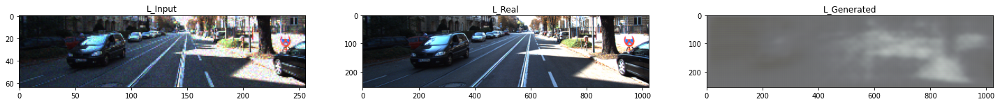

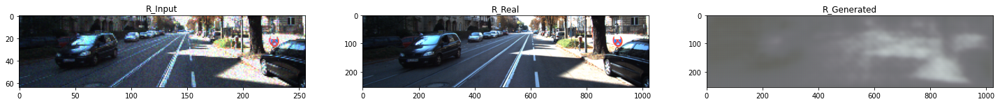

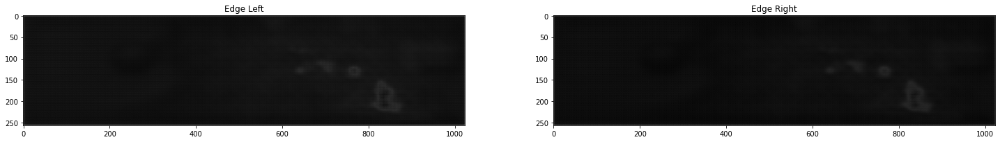

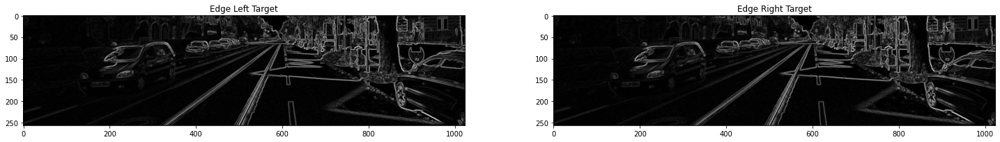

epoch 0  gan_loss: 3.109022855758667  l1_loss: 22.665082931518555  disc_loss: 6.502560615539551 sobel_loss: 0.4238375425338745 pair_color_loss: 2.960822582244873
-------- psnr:  58.364494    ----- epoch:  1


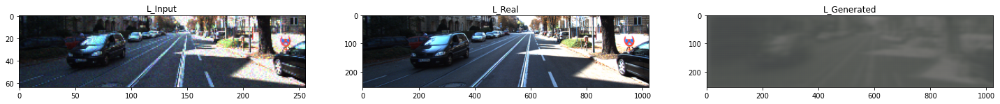

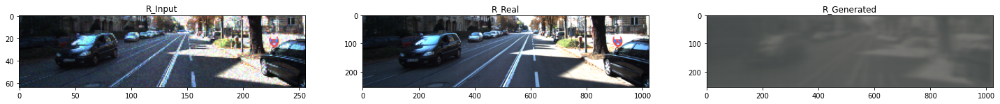

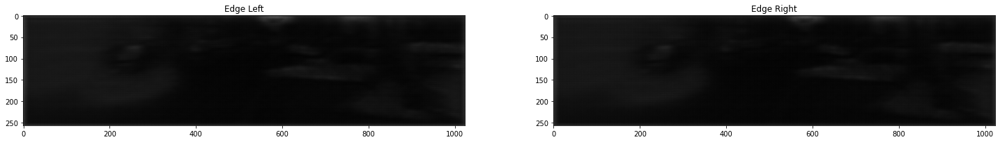

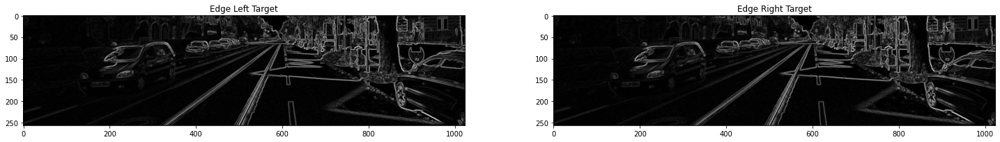

epoch 1  gan_loss: 2.6004526615142822  l1_loss: 11.073502540588379  disc_loss: 5.636866569519043 sobel_loss: 0.16032156348228455 pair_color_loss: 0.8029223084449768
-------- psnr:  91.8149    ----- epoch:  2


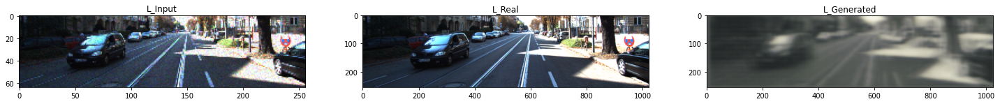

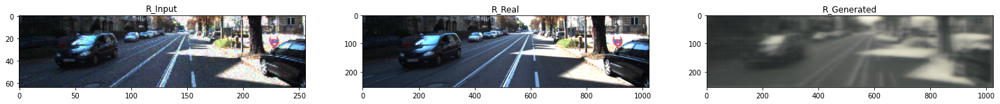

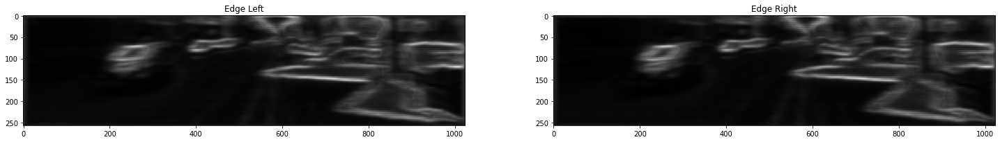

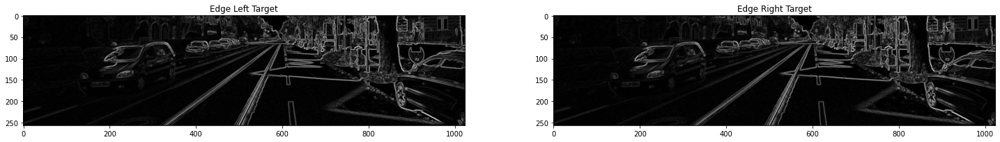

epoch 2  gan_loss: 7.472585678100586  l1_loss: 19.036888122558594  disc_loss: 12.603533744812012 sobel_loss: 0.1283445805311203 pair_color_loss: 2.3163063526153564
-------- psnr:  97.72008    ----- epoch:  3


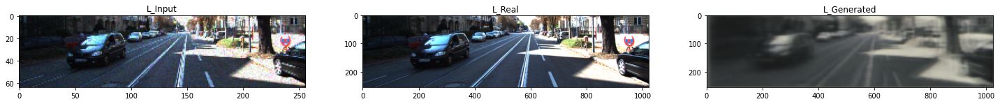

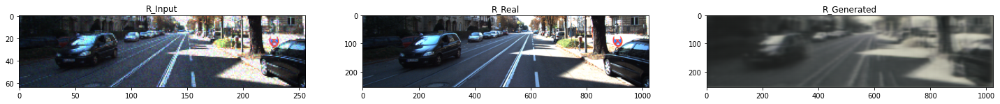

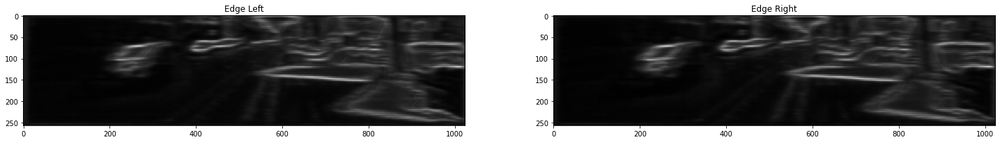

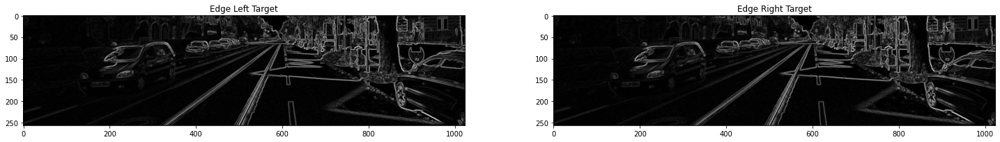

epoch 3  gan_loss: 3.209196090698242  l1_loss: 9.653231620788574  disc_loss: 5.469120025634766 sobel_loss: 0.10234595090150833 pair_color_loss: 0.7753539681434631
-------- psnr:  113.51289    ----- epoch:  4


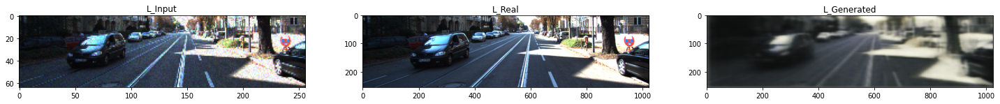

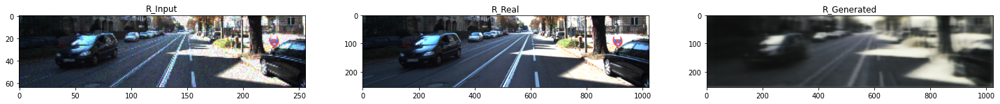

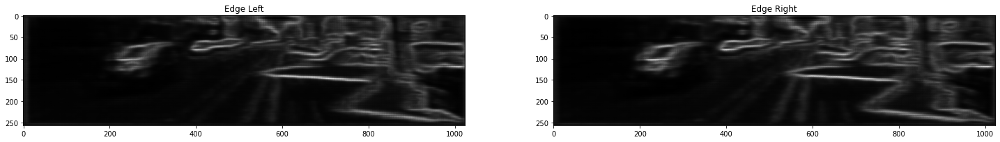

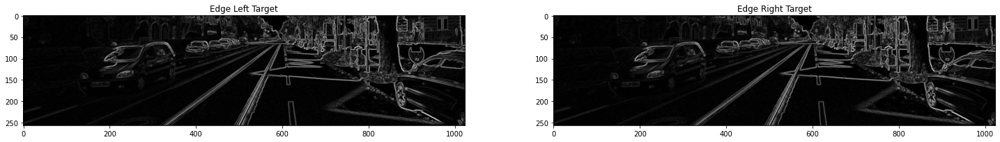

epoch 4  gan_loss: 2.8431143760681152  l1_loss: 10.618616104125977  disc_loss: 5.52883768081665 sobel_loss: 0.10479356348514557 pair_color_loss: 0.6744745373725891
-------- psnr:  109.87245    ----- epoch:  5
epoch 5  gan_loss: 2.6673202514648438  l1_loss: 14.271909713745117  disc_loss: 5.534760475158691 sobel_loss: 0.08167964220046997 pair_color_loss: 1.2277268171310425


In [ ]:
        
EPOCHS = 151
fit(train_dataset, EPOCHS, test_dataset)

### Show

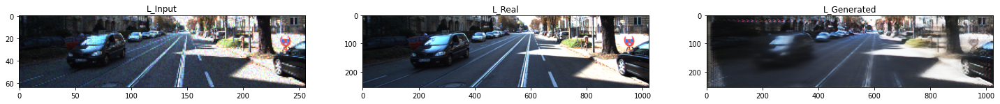

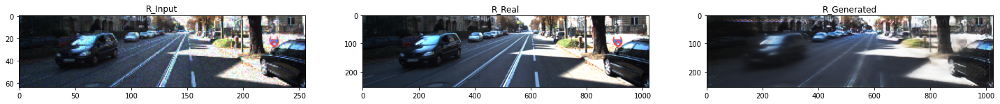

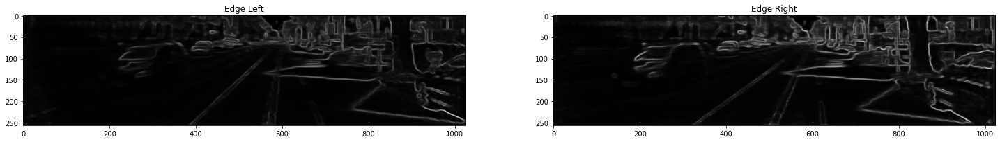

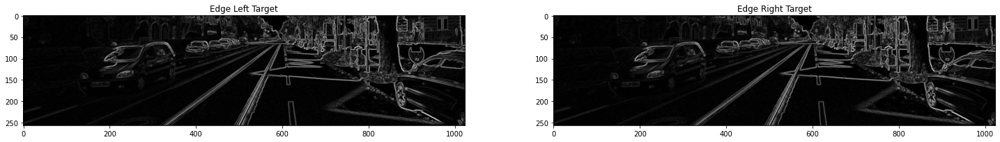

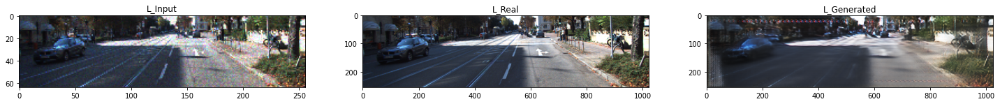

...

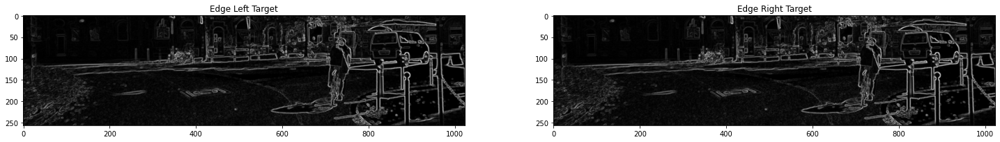

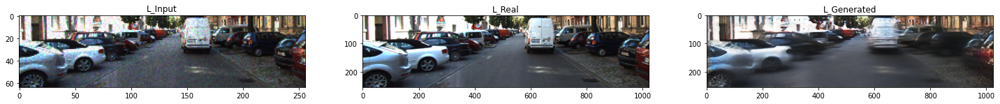

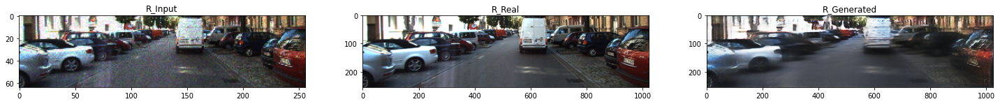

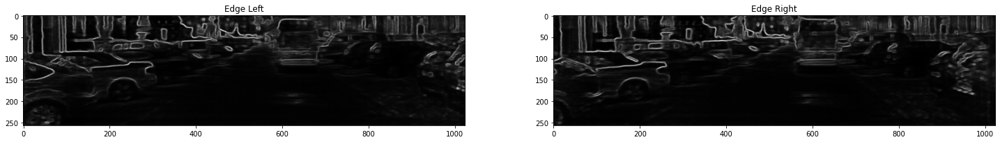

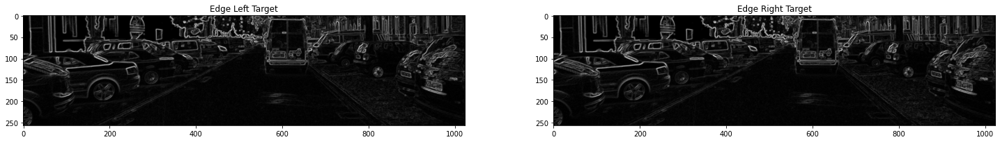

In [37]:
for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, _, _, _ in test_dataset.take(5):
                generate_images(generator, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr)